# 导包+读入数据+预处理

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

from sklearn import model_selection
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB,BernoulliNB
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
import lightgbm as lgb

from mlxtend.classifier import StackingClassifier
import warnings
warnings.simplefilter('ignore')
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import cross_val_score
from sklearn.metrics import classification_report,roc_auc_score
from sklearn.metrics import confusion_matrix,classification_report, accuracy_score, recall_score, f1_score, precision_score

import eli5
from eli5.sklearn import PermutationImportance
%matplotlib inline
%config InlineBackend.figure_format = 'svg'  # 图片输出为矢量图，保证清晰度

In [2]:
from sklearn.model_selection import KFold
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import f1_score

In [4]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers


In [5]:
data=pd.read_csv('./clean-data.csv')
data=data.drop(['Unnamed: 0'],axis=1)
X=data.drop(['Group'],axis=1)
y=data['Group']

In [6]:
column=X.columns
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X=sc.fit_transform(X)
X=pd.DataFrame(data=X,columns=column)

# 划分数据集的训练集和测试集

In [7]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=42,stratify=None)

# Voting和Stacking的交叉验证

In [8]:
def testpredict(estimator, Xtrain, ytrain, Xtest, ytest):
    print("Test on the testing set")
    model = estimator.fit(Xtrain, ytrain)
    y_pred_test = model.predict(Xtest)
    confusion = confusion_matrix(ytest, y_pred_test)
    accuracy = accuracy_score(ytest, y_pred_test)
    precision = precision_score(ytest, y_pred_test)
    recall = recall_score(ytest, y_pred_test)
    f1 = f1_score(ytest, y_pred_test)
    wf1 = f1_score(ytest, y_pred_test, average='weighted')
    
    # 创建性能指标条形图
    metrics = ['Accuracy', 'Precision', 'Recall', 'F1-score', 'Weighted F1']
    scores = [accuracy, precision, recall, f1, wf1]
    plt.bar(metrics, scores)
    
    # 添加数字标签
    for i, score in enumerate(scores):
        plt.text(i, score, f"{score:.4f}", ha='center', va='bottom')
    
    # 添加标签和标题
    plt.xlabel('Performance Metrics')
    plt.ylabel('Score')
    plt.title('Model Performance on Testing Set')
    
    # 展示图表
    
    #plt.savefig('模型性能.png', dpi=500, bbox_inches='tight') 
    
    plt.show()
    
    # 可视化混淆矩阵
    import seaborn as sns

    confusion = confusion_matrix(ytest, y_pred_test)
    classes = [0, 1]  

    sns.heatmap(confusion, annot=True, cmap='Blues', fmt='d', xticklabels=classes, yticklabels=classes)
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.title('Confusion Matrix')

    plt.show()

    return accuracy, precision, recall, f1, wf1

def crosspredict(estimator, Xtrain, ytrain, cv):
    print("Cross-validate across the entire data set")
    y_pred_cross = cross_val_predict(estimator, Xtrain, ytrain, cv=cv)
    confusion_cross = confusion_matrix(ytrain, y_pred_cross)
    accuracy = accuracy_score(ytrain, y_pred_cross)
    precision = precision_score(ytrain, y_pred_cross)
    recall = recall_score(ytrain, y_pred_cross)
    f1 = f1_score(ytrain, y_pred_cross)
    wf1 = f1_score(ytrain, y_pred_cross, average='weighted')
    
    # 创建性能指标条形图
    metrics = ['Accuracy', 'Precision', 'Recall', 'F1-score', 'Weighted F1']
    scores = [accuracy, precision, recall, f1, wf1]
    plt.bar(metrics, scores)
    
    # 添加数字标签
    for i, score in enumerate(scores):
        plt.text(i, score, f"{score:.4f}", ha='center', va='bottom')
    
    # 添加标签和标题
    plt.xlabel('Performance Metrics')
    plt.ylabel('Score')
    plt.title('Model Performance on Cross-validation')
    
    # 展示图表
    
    #plt.savefig('模型性能.png', dpi=500, bbox_inches='tight') 
    
    plt.show()
    
    # 可视化混淆矩阵
    import seaborn as sns

    confusion = confusion_matrix(ytrain, y_pred_cross)
    classes = [0, 1]  

    sns.heatmap(confusion, annot=True, cmap='Blues', fmt='d', xticklabels=classes, yticklabels=classes)
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.title('Confusion Matrix') 
    plt.show()

    return accuracy, precision, recall, f1, wf1

# 11种模型的构建

In [9]:
clf1=SVC(C=1, coef0=10, degree=4, kernel='poly', probability=True)
clf2=KNeighborsClassifier(n_neighbors=3, p=1)
clf3=LogisticRegression(C=0.1)
clf4=GaussianNB()
clf5=BernoulliNB()
clf6=DecisionTreeClassifier(max_depth=5, min_samples_leaf=2, min_samples_split=6)
clf7=RandomForestClassifier(max_depth=8, n_estimators=105, n_jobs=-1,random_state=90)
clf8=AdaBoostClassifier(learning_rate=0.1)
clf9=GradientBoostingClassifier(loss='exponential', n_estimators=300)
clf10=XGBClassifier(booster='gblinear',learning_rate=0.3,n_estimators=10)
clf11=lgb.LGBMClassifier(max_depth=3, n_estimators=300)

In [10]:
from sklearn.base import ClassifierMixin
from sklearn.base import TransformerMixin, BaseEstimator
class MyEstimator(BaseEstimator, ClassifierMixin):
    def __init__(self, model, mask) -> None:
        super().__init__()
        self.mask = mask
        self.model = model
    
    def fit(self, X, y=None):
        self.model.fit(X[self.mask],y)
        return self

    def predict(self, X):
        return self.model.predict(X[self.mask])
    
    def predict_proba(self,X):
        return self.model.predict_proba(X[self.mask])

# Voting的十折交叉验证

Cross-validate across the entire data set


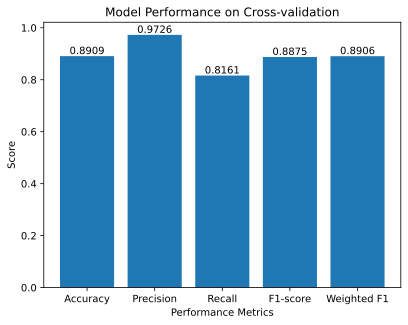

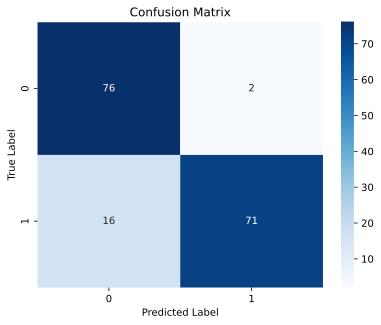

In [11]:
from itertools import *
sel_seq_dt_mask=['APG_0101010010M','APG_0101010055P','APG_0101010063M','APG_0101010341M','APG_0101010354P']
sel_seq_rf_mask=['APG_0101010055P','APG_0101010262P','APG_0101010266P']
sel_seq_ada_mask=['APG_0101010033M','APG_0101010063M','APG_0101010067M','APG_0101010147M','APG_0101010192M', 'APG_0101010236M']
sel_seq_gb_mask=['APG_0101010002M','APG_0101010055P','APG_0101010266P','APG_0101010354P']
sel_seq_xgb_mask=['APG_0101010010M','APG_0101010037P','APG_0101010063M','APG_0101010078P','APG_0101010150P','APG_0101010230P','APG_0101010279P','APG_0101010312P','APG_0101020013M']
sel_seq_KN_mask=['APG_0101010002M', 'APG_0101010010M', 'APG_0101010052M','APG_0101010055P', 'APG_0101010176P']
sel_seq_Lightgbm_mask=['APG_0101010036M','APG_0101010078P','APG_0101010130P','APG_0101010192M','APG_0101010226P','APG_0101010242P','APG_0101010265P']
sel_seq_SVC_mask=['APG_0101010002M', 'APG_0101010010M', 'APG_0101010037P', 'APG_0101010039M', 'APG_0101010055P', 'APG_0101010143P', 'APG_0101010247P', 'APG_0101010300P', 'APG_0101010332P']
sel_seq_GNB_mask=['APG_0101010010M','APG_0101010055P','APG_0101010057M','APG_0101010081M','APG_0101010085P','APG_0101010199P','APG_0101010264P','APG_0101010279P', 'APG_0101010300P']
sel_seq_lr_mask=['APG_0101010010M','APG_0101010030M','APG_0101010041M','APG_0101010043P','APG_0101010137P','APG_0101010150P','APG_0101010152M','APG_0101010168P','APG_0101010176P','APG_0101010356P']

feature=list(set(sel_seq_dt_mask+sel_seq_rf_mask+sel_seq_ada_mask+sel_seq_xgb_mask+sel_seq_GNB_mask))

model_dt_fs = MyEstimator(DecisionTreeClassifier(max_depth=5, min_samples_leaf=2, min_samples_split=6), sel_seq_dt_mask)
model_rf_fs = MyEstimator(RandomForestClassifier(max_depth=8, n_estimators=105, n_jobs=-1,random_state=90), sel_seq_rf_mask)
model_ada_fs = MyEstimator(AdaBoostClassifier(learning_rate=0.1), sel_seq_ada_mask)
model_gb_fs = MyEstimator(GradientBoostingClassifier(loss='exponential', n_estimators=300), sel_seq_gb_mask)
model_xgb_fs = MyEstimator(XGBClassifier(booster='gblinear',learning_rate=0.3,n_estimators=10), mask=sel_seq_xgb_mask)
model_KN_fs = MyEstimator(KNeighborsClassifier(n_neighbors=3, p=1), mask=sel_seq_KN_mask)
model_Lightgbm_fs = MyEstimator(lgb.LGBMClassifier(max_depth=3, n_estimators=300), mask=sel_seq_Lightgbm_mask)
model_SVC_fs = MyEstimator(SVC(C=1, coef0=10, degree=4, kernel='poly', probability=True),mask=sel_seq_SVC_mask)
model_GNB_fs = MyEstimator(GaussianNB(),mask=sel_seq_GNB_mask)
model_lr_fs = MyEstimator(LogisticRegression(C=0.1),mask=sel_seq_lr_mask)

from sklearn.ensemble import VotingClassifier
model_voting_cross = VotingClassifier([  
    ("dt",model_dt_fs),
    ("rf",model_rf_fs ),
    ("ada", model_ada_fs),
    ("xgb", model_xgb_fs),
    ("GNB",model_GNB_fs),
], voting="hard")
a,b,c,d,e=crosspredict(model_voting_cross,X,y,10)


Cross-validate across the entire data set


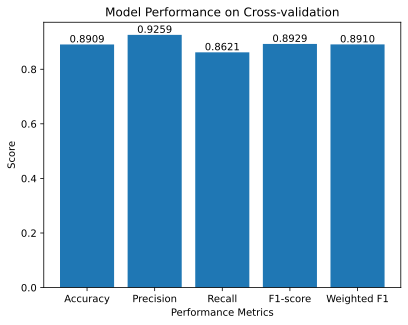

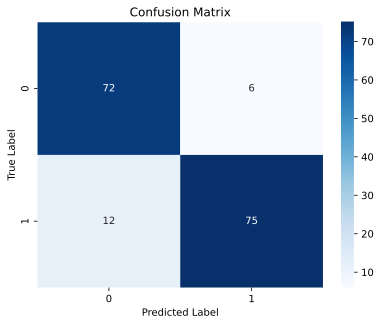

In [12]:
model_Stacking_cross = StackingClassifier(classifiers=[
    (model_dt_fs),
    (model_rf_fs ),
    (model_ada_fs),
    (model_GNB_fs),
    (model_xgb_fs),
],meta_classifier=clf3)
a,b,c,d,e=crosspredict(model_Stacking_cross,X,y,10)

# 可解释性

# Stacking特征排序

In [11]:
from eli5 import show_weights
from eli5.sklearn import PermutationImportance

my_model = model_Stacking_cross.fit(X_train, y_train)
perm = PermutationImportance(my_model, random_state=3).fit(X_test, y_test)
feature_names = X_test.columns.tolist()

show_weights(perm, feature_names=feature_names)

Weight,Feature
0.1152 ± 0.0970,APG_0101010055P
0.0485 ± 0.0907,APG_0101010262P
0.0242 ± 0.1294,APG_0101010266P
0.0242 ± 0.0454,APG_0101010010M
0.0242 ± 0.0454,APG_0101010033M
0.0121 ± 0.0297,APG_0101010264P
0.0121 ± 0.0297,APG_0101010150P
0.0061 ± 0.0242,APG_0101010147M
0.0061 ± 0.0242,APG_0101010192M
0.0061 ± 0.0242,APG_0101010300P


# Voting特征排序

In [12]:
my_model = model_voting_cross.fit(X_train, y_train)
perm = PermutationImportance(my_model, random_state=3).fit(X_test, y_test)
feature_names = X_test.columns.tolist()

show_weights(perm, feature_names=feature_names)

Weight,Feature
0.1636 ± 0.0907,APG_0101010055P
0.0424 ± 0.0822,APG_0101010063M
0.0364 ± 0.0707,APG_0101010192M
0.0303 ± 0.0000,APG_0101010010M
0.0303 ± 0.0383,APG_0101010264P
0.0303 ± 0.0383,APG_0101010033M
0.0303 ± 0.0383,APG_0101010300P
0.0242 ± 0.0707,APG_0101010266P
0.0182 ± 0.0297,APG_0101010150P
0.0121 ± 0.0485,APG_0101010085P


# 每个基模型的蜂窝图+力图+LIME

In [15]:
import shap
from lime import lime_tabular
plt.rcParams['axes.unicode_minus'] =False
shap.initjs()

# AdaBoost

In [18]:
ada=AdaBoostClassifier(learning_rate=0.1).fit(X_train,y_train)
ada_shap_explainer=shap.TreeExplainer(ada)
ada_shap_values=ada_shap_explainer.shap_values(X_test)
shap.summary_plot(ada_shap_values[1],X_test,max_display=10,show=False)
plt.title('AdaBoost')
# plt.savefig('E:/lung_cancer_prediction/images/Private data set/summary_plot_ada.png', dpi=500, bbox_inches='tight')

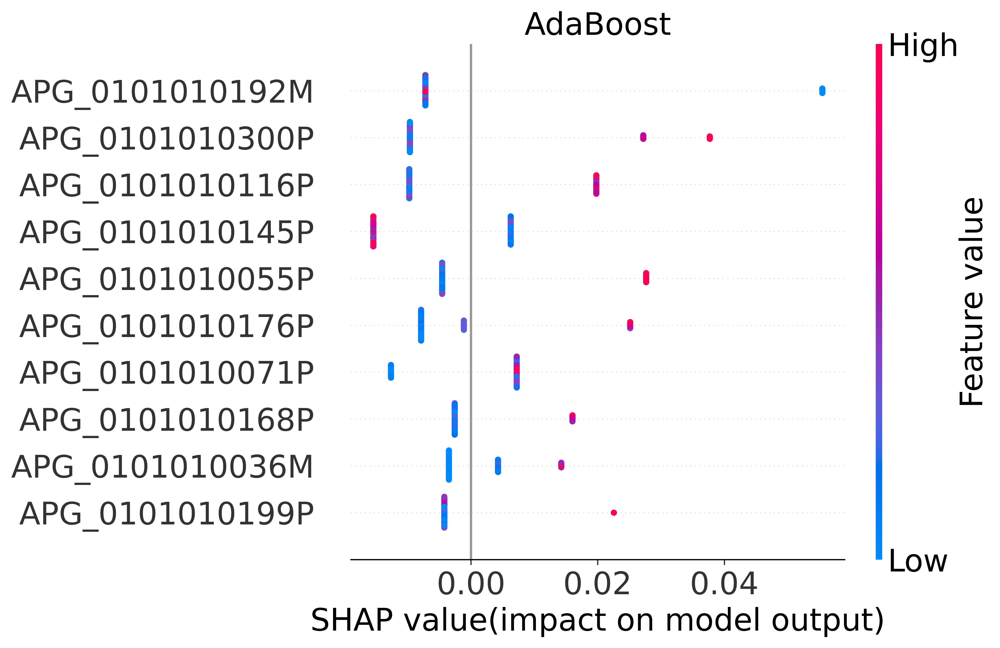

ada_explainer.expected_value[1] 是模型类别 1 的期望值，ada_shap_values[1][1] 是样本 1 在模型类别 1 上的 Shapley 值，X_test.iloc[1] 是样本 1 的特征值。

In [20]:
import shap
import matplotlib.pyplot as plt

#shap.force_plot(ada_shap_explainer.expected_value[0], ada_shap_values[0][3], X_test.iloc[3],show=False,matplotlib=True)
shap.force_plot(ada_shap_explainer.expected_value[0], ada_shap_values[0][3], X_test.iloc[3])


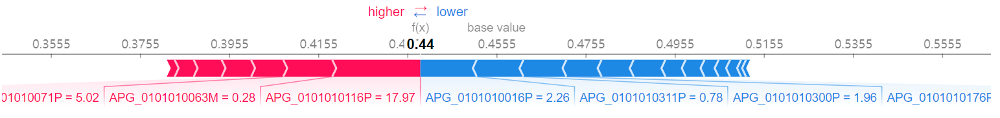

ada_explainer.expected_value[0] 是模型类别 0 的期望值，ada_shap_values[0][3] 是样本 3 在模型类别 0 上的 Shapley 值，X_test.iloc[3] 是样本 3 的特征值。

In [9]:
import shap
import matplotlib.pyplot as plt
print("                                                                 (a)AdaBoost")
shap.force_plot(ada_shap_explainer.expected_value[1], ada_shap_values[1][6], X_test.iloc[6])


                                                                 (a)AdaBoost


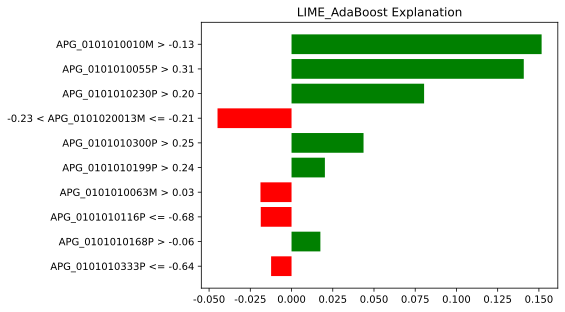

In [17]:


# 创建LIME解释器
ada_lime_explainer = lime_tabular.LimeTabularExplainer(X_train.values, feature_names=X_train.columns.tolist(), class_names=['Negative', 'Positive'],discretize_continuous=True)

# 解释单个样本
exp = ada_lime_explainer.explain_instance(X_test.iloc[4].values, ada.predict_proba, num_features=10)

# 可视化展示
fig = exp.as_pyplot_figure()
plt.title('LIME_AdaBoost Explanation')
plt.savefig('./LIME_ada.png', dpi=500, bbox_inches='tight') 
plt.show()

In [21]:
# 创建LIME解释器
ada_lime_explainer = lime_tabular.LimeTabularExplainer(X_train.values, feature_names=X_train.columns.tolist(), class_names=['Negative', 'Positive'],discretize_continuous=False)

# 解释单个样本
exp = ada_lime_explainer.explain_instance(X_test.iloc[4].values, ada.predict_proba, num_features=10)

# 可视化展示
# fig = exp.as_pyplot_figure()
# plt.title('LIME_AdaBoost Explanation')
# plt.show()
exp.show_in_notebook(show_table=False,show_all=False)

## XGBoost

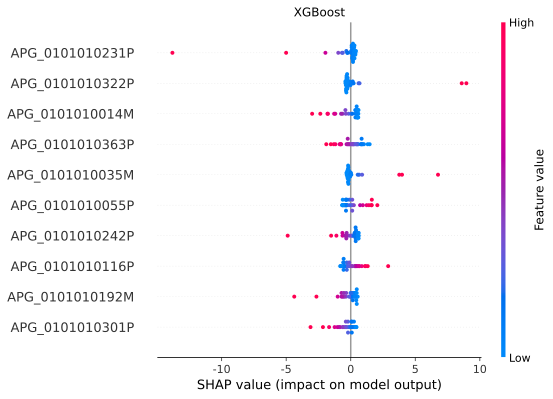

In [23]:
xgb=XGBClassifier(booster='gblinear',learning_rate=0.3,n_estimators=10).fit(X_train,y_train)

xgb_shap_explainer = shap.LinearExplainer(xgb, X_train)

xgb_shap_values = xgb_shap_explainer.shap_values(X_test)

shap.summary_plot(xgb_shap_values, X_test,max_display=10,show=False)

plt.title('XGBoost')
plt.savefig('./summary_plot_xgb.png', dpi=500, bbox_inches='tight')

In [24]:
print("                                                                 (b)XGBoost")
shap.force_plot(xgb_shap_explainer.expected_value, xgb_shap_values[0], X_test.iloc[4])

                                                                 (b)XGBoost


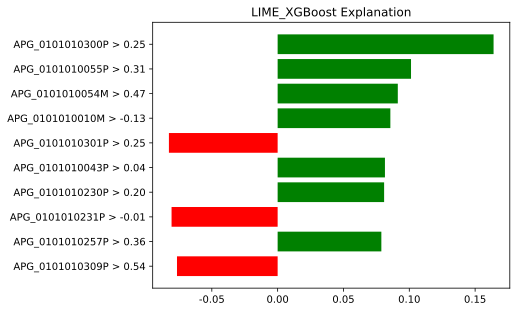

In [25]:
xgb_lime_explainer = lime_tabular.LimeTabularExplainer(X_train.values, feature_names=X_train.columns.tolist(), class_names=['Negative', 'Positive'])

clf5=XGBClassifier(booster='gblinear',learning_rate=0.3,n_estimators=10)
predict_fn_xgb=lambda x:clf5.predict_proba(x,validate_features=False).astype(float)
clf5.fit(X_train,y_train)

x1 = X_test.iloc[4]

# exp_clf5 = explainer.explain_instance(x1, clf5.predict_proba, num_features=10)
exp_clf5 = xgb_lime_explainer.explain_instance(x1, predict_fn_xgb, num_features=10)
# 输出解释性结果
fig = exp_clf5.as_pyplot_figure()
plt.title('LIME_XGBoost Explanation')
plt.savefig('./LIME_xgb.png', dpi=500, bbox_inches='tight') 
plt.show()

In [26]:
xgb_lime_explainer = lime_tabular.LimeTabularExplainer(X_train.values, feature_names=X_train.columns.tolist(), class_names=['Negative', 'Positive'],discretize_continuous=False)


clf5=XGBClassifier(booster='gblinear',learning_rate=0.3,n_estimators=10)
predict_fn_xgb=lambda x:clf5.predict_proba(x,validate_features=False).astype(float)
clf5.fit(X_train,y_train)

x1 = X_test.iloc[4]

# exp_clf5 = explainer.explain_instance(x1, clf5.predict_proba, num_features=10)
exp_clf5 = xgb_lime_explainer.explain_instance(x1, predict_fn_xgb, num_features=10)
# 输出解释性结果
#fig = exp_clf5.as_pyplot_figure()
#plt.savefig('LIME_xgb.png', dpi=500, bbox_inches='tight') 
exp_clf5.show_in_notebook(show_table=False,show_all=False)
#plt.show()

# RF

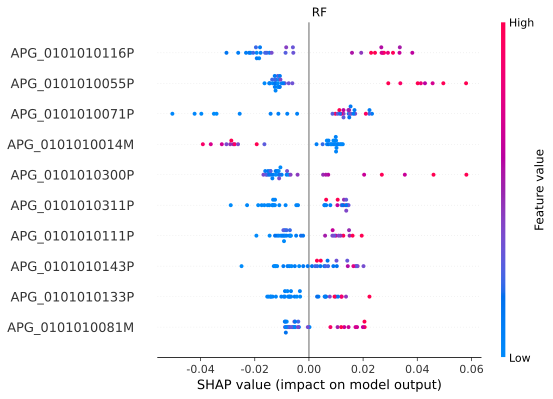

In [27]:
rf=RandomForestClassifier().fit(X_train,y_train)
rf_shap_explainer=shap.TreeExplainer(rf)
rf_shap_values=rf_shap_explainer.shap_values(X_test)
shap.summary_plot(rf_shap_values[1],X_test,max_display=10,show=False)

plt.title('RF')
plt.savefig('./summary_plot_RF.png', dpi=500, bbox_inches='tight')

In [28]:
print("                                                                 (c)Random Forest")
shap.force_plot(rf_shap_explainer.expected_value[1], rf_shap_values[1][4], X_test.iloc[4])

                                                                 (c)Random Forest


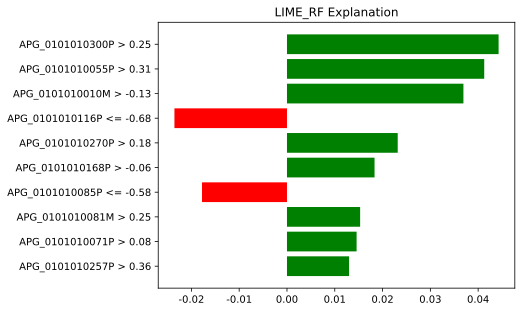

In [29]:
rf_lime_explainer = lime_tabular.LimeTabularExplainer(X_train.values, feature_names=X_train.columns.tolist(), class_names=['Negative', 'Positive'])

# 解释单个样本
exp = rf_lime_explainer.explain_instance(X_test.iloc[4].values, rf.predict_proba, num_features=10)

# 可视化展示
fig = exp.as_pyplot_figure()
plt.title('LIME_RF Explanation')
plt.savefig('./LIME_RF.png', dpi=500, bbox_inches='tight') 
plt.show()

In [30]:
# 创建LIME解释器
rf_lime_explainer = lime_tabular.LimeTabularExplainer(X_train.values, feature_names=X_train.columns.tolist(), class_names=['Negative', 'Positive'],discretize_continuous=False)

# 解释单个样本
exp = rf_lime_explainer.explain_instance(X_test.iloc[4].values, rf.predict_proba, num_features=10)

# 可视化展示
# fig = exp.as_pyplot_figure()
# plt.title('LIME_RF Explanation')
# plt.show()
exp.show_in_notebook(show_table=False,show_all=False)

# GNB(高斯朴素贝叶斯)

Using 132 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


  0%|          | 0/33 [00:00<?, ?it/s]

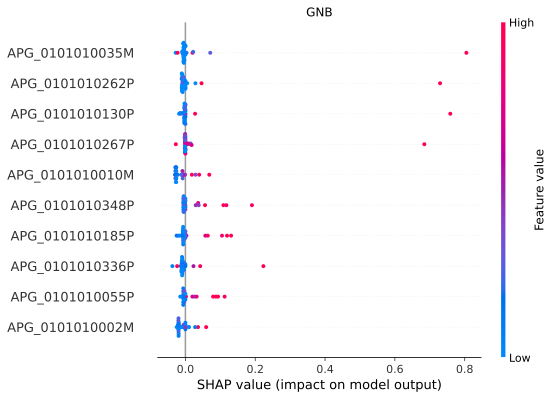

In [31]:
import shap
from sklearn.naive_bayes import GaussianNB

# 创建和拟合GaussianNB模型
GNB = GaussianNB()
GNB.fit(X_train, y_train)

# 创建KernelExplainer解释器
GNB_shap_explainer = shap.KernelExplainer(GNB.predict_proba, X_train)

# 计算SHAP值
GNB_shap_values = GNB_shap_explainer.shap_values(X_test)

# 生成摘要图
shap.summary_plot(GNB_shap_values[1], X_test, max_display=10, show=False)

# 保存摘要图为文件
import matplotlib.pyplot as plt
plt.title('GNB')
plt.savefig('./summary_plot_GNB.png', dpi=500, bbox_inches='tight')


In [32]:
print("                                                                 (d)Gaussian Naive Bayes")
shap.force_plot(GNB_shap_explainer.expected_value[1], GNB_shap_values[1][4], X_test.iloc[4])

                                                                 (d)Gaussian Naive Bayes


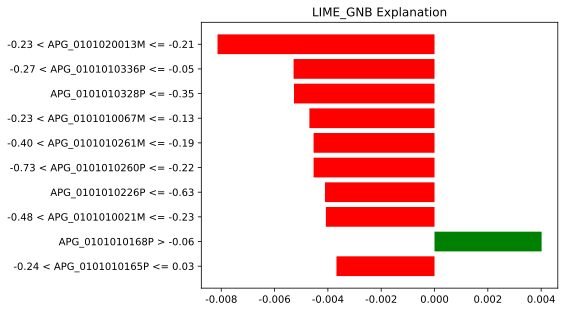

In [33]:
GNB_lime_explainer = lime_tabular.LimeTabularExplainer(X_train.values, feature_names=X_train.columns.tolist(), class_names=['Negative', 'Positive'])

# 解释单个样本
exp = GNB_lime_explainer.explain_instance(X_test.iloc[4].values, GNB.predict_proba, num_features=10)

# 可视化展示
fig = exp.as_pyplot_figure()
plt.title('LIME_GNB Explanation')
plt.savefig('./LIME_GNB.png', dpi=500, bbox_inches='tight') 
plt.show()

In [34]:
# 创建LIME解释器
GNB_lime_explainer = lime_tabular.LimeTabularExplainer(X_train.values, feature_names=X_train.columns.tolist(), class_names=['Negative', 'Positive'],discretize_continuous=False)

# 解释单个样本
exp = GNB_lime_explainer.explain_instance(X_test.iloc[4].values, GNB.predict_proba, num_features=10)

# # 可视化展示
# fig = exp.as_pyplot_figure()
# plt.title('LIME_GNB Explanation')
# plt.show()
exp.show_in_notebook(show_table=False,show_all=False)

# dt(决策树)

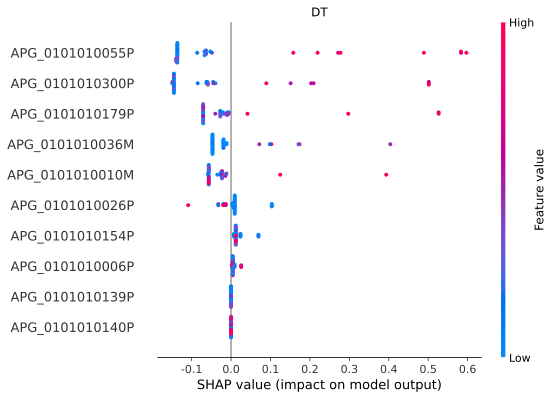

In [35]:
dt=DecisionTreeClassifier(max_depth=5, min_samples_leaf=2, min_samples_split=6).fit(X_train,y_train)
dt_shap_explainer=shap.TreeExplainer(dt)
dt_shap_values=dt_shap_explainer.shap_values(X_test)
shap.summary_plot(dt_shap_values[1],X_test,max_display=10,show=False)

plt.title('DT')
plt.savefig('./summary_plot_DT.png', dpi=500, bbox_inches='tight')

In [36]:
print("                                                                 (e)Decision Tree")
shap.force_plot(dt_shap_explainer.expected_value[1], dt_shap_values[1][4], X_test.iloc[4])

                                                                 (e)Decision Tree


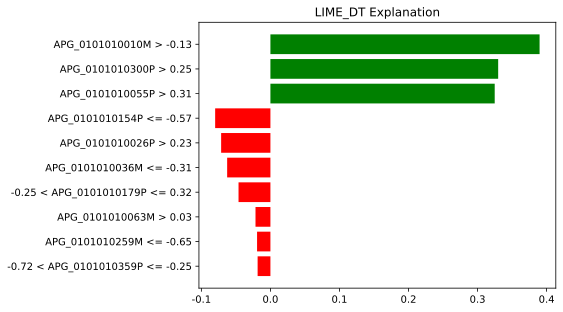

In [37]:
dt_lime_explainer = lime_tabular.LimeTabularExplainer(X_train.values, feature_names=X_train.columns.tolist(), class_names=['Negative', 'Positive'])

# 解释单个样本
exp = dt_lime_explainer.explain_instance(X_test.iloc[4].values, dt.predict_proba, num_features=10)

# 可视化展示
fig = exp.as_pyplot_figure()
plt.title('LIME_DT Explanation')
plt.savefig('./LIME_Decision Tree.png', dpi=500, bbox_inches='tight') 
plt.show()

In [119]:
# 创建LIME解释器
dt_lime_explainer = lime_tabular.LimeTabularExplainer(X_train.values, feature_names=X_train.columns.tolist(), class_names=['Negative', 'Positive'],discretize_continuous=False)

# 解释单个样本
exp = dt_lime_explainer.explain_instance(X_test.iloc[3].values, dt.predict_proba, num_features=10)

# # 可视化展示
# fig = exp.as_pyplot_figure()
# plt.title('LIME_dt Explanation')
# plt.show()
exp.show_in_notebook(show_table=False,show_all=False)

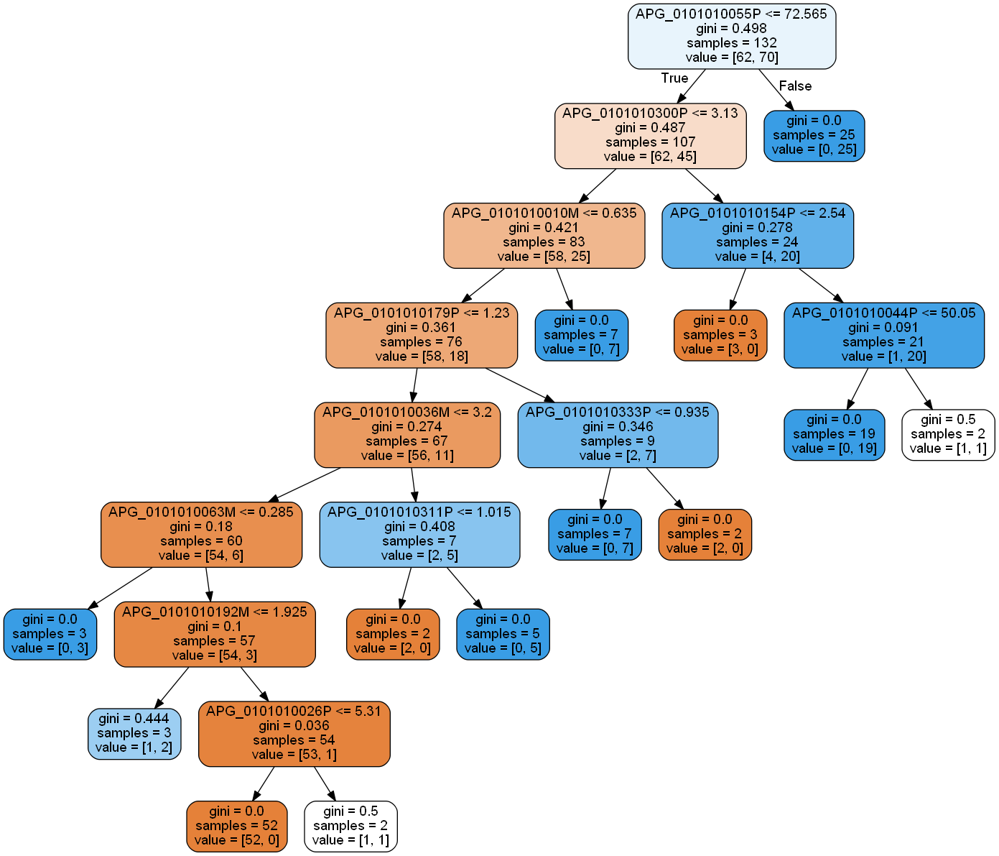

In [84]:
from IPython.display import Image
from six import StringIO
from sklearn.tree import export_graphviz
import pydot
#模型基于决策树，可视化决策树的决策过程
tree=DecisionTreeClassifier(max_depth=10, min_samples_leaf=2, min_samples_split=6).fit(X_train,y_train)
features=X_test.columns
dot_data=StringIO()
export_graphviz(tree,out_file=dot_data,feature_names=features,filled=True,rounded=True)

dot_data_value=dot_data.getvalue().replace('\n','')  # 去除图上的小黑点
graph=pydot.graph_from_dot_data(dot_data_value)
Image(graph[0].create_png())

## 组合图片

In [3]:
from PIL import Image
import glob

# 获取所有需要拼接的图像路径
path = 'E:/lung_cancer_prediction/images/Private data set'  # 图片所在的目录路径
image_paths = glob.glob(path + '/summary_plot*.png')

rows=3
cols=2

# 读入第一张图像作为基准
base_image = Image.open(image_paths[0])

# 获取基准图像的尺寸
w,h = 4000,3000

# 创建空白图像
result = Image.new('RGB', (w*cols,h*rows),color='white')

# 将所有图像拼接在一起
for i in range(rows):
    for j in range(cols):
        index = i*cols+j
        if index < len(image_paths):
            image = Image.open(image_paths[index])
            result.paste(image, (j*w, i*h))


# 显示结果
result.save('E:/lung_cancer_prediction/images/Private data set/summary_plot.jpg')
#result.show()

In [11]:

from PIL import Image, ImageDraw, ImageFont
import glob

# 获取所有需要拼接的图像路径
path = 'E:/lung_cancer_prediction/images/Private data set'  # 图片所在的目录路径
image_paths = glob.glob(path + '/LIME*.png')

rows=2
cols=2

# 读入第一张图像作为基准
base_image = Image.open(image_paths[0])

# 获取基准图像的尺寸
w,h = 4000,2200

passw=w/2
passh=2000

# 创建空白图像
result = Image.new('RGB', (w*cols,h*rows),color='white')

t="a"
text='(%s)'%(t)
draw = ImageDraw.Draw(result)
font_size = 100  
font = ImageFont.truetype('arial.ttf',font_size)

# 将所有图像拼接在一起
for i in range(rows):
    for j in range(cols):
        index = i*cols+j
        if index < len(image_paths):
            image = Image.open(image_paths[index])
            result.paste(image, (j*w, i*h))
            x=j*w+passw
            y=i*h+passh
            text='(%s)'%(t)
            draw.text((x,y),text,fill=(0,0,0),font=font)
            t=chr(ord(t) + 1)  


# 显示结果
result.save('E:/lung_cancer_prediction/images/Private data set/LIME.jpg')
result.show()

In [12]:
from PIL import Image
import glob

# 获取所有需要拼接的图像路径
path = 'E:/lung_cancer_prediction/images/Private data set'  # 图片所在的目录路径
image_paths = glob.glob(path + '/force_plot*.png')

rows=4
cols=1

# 读入第一张图像作为基准
base_image = Image.open(image_paths[0])

# 获取基准图像的尺寸
w,h = 1500,250

# 创建空白图像
result = Image.new('RGB', (w*cols,h*rows),color='white')

# 将所有图像拼接在一起
for i in range(rows):
    for j in range(cols):
        index = i*cols+j
        if index < len(image_paths):
            image = Image.open(image_paths[index])
            result.paste(image, (j*w, i*h))


# 显示结果
result.save('E:/lung_cancer_prediction/images/Private data set/force_plot.jpg')
result.show()

In [13]:
from PIL import Image
import glob

# 获取所有需要拼接的图像路径
path = 'E:/lung_cancer_prediction/images/Private data set'  # 图片所在的目录路径
image_paths = glob.glob(path + '/PDP_APG*.png')

rows=4
cols=2

# 读入第一张图像作为基准
base_image = Image.open(image_paths[0])

# 获取基准图像的尺寸
w,h = 6200,4000

# 创建空白图像
result = Image.new('RGB', (w*cols,h*rows),color='white')

# 将所有图像拼接在一起
for i in range(rows):
    for j in range(cols):
        index = i*cols+j
        if index < len(image_paths):
            image = Image.open(image_paths[index])
            result.paste(image, (j*w, i*h))


# 显示结果
result.save('E:/lung_cancer_prediction/images/Private data set/PDP.jpg')
#result.show()